## Evaluate image quality with L2 regualrized model 

Author: Iris Liu <br>
Date Created: Jun 21, 2019

In [1]:
import tensorflow as tf
import csv
import os, sys
import math

from config import *
from model import *
import matplotlib.pyplot as plt
import numpy as np
import cv2
# from util import *

In [2]:
def read_img_tf(path):
    return tf.image.decode_image(tf.read_file(path))

def read_img(path):
    img = cv2.imread(path)
    # cv2 originally read image in bgr channel
    # convert and dispaly image in rgb channel
    b,g,r = cv2.split(img) 
    img_rgb = cv2.merge([r,g,b]) 
    return img_rgb


In [3]:
def rgb2gray(rgb_img):
    greyscale_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)
    return greyscale_img

#### Calculate MSE

To measure the image quality, we measure the MSE of images. Images are converted to 2D array of matrixes / data and feed into the algorithm.

![MSE](https://ni.scene7.com/is/image/ni/MSE_MATH?scl=1 "MSE Equation")

In [4]:
def compute_color_mse(im_batch1, im_batch2):
    """ Compute color psnr in 3 channels
    Args:
        im_batch1 (numpy array): numpy array of source image
        im_batch2 (numpy array): numpy array of target image
    Return:
        psnr (float)
    """
    mean_mse = 0
#     im_batch1 = im_batch1.squeeze()
#     im_batch2 = im_batch2.squeeze()
    num = im_batch2.shape[0]
    for i in range(num):
        # Convert pixel value to [0,255]
        im1 = im_batch1[(i%im_batch1.shape[0])]
        im2 = im_batch2[i]
#         print(im1.shape)
        mses = mse(im1, im2)
        mean_mse += mses
#         mse1 = mse(im1[:,:,0], im2[:,:,0])
#         mse2 = mse(im1[:,:,1], im2[:,:,1])
#         mse3 = mse(im1[:,:,2], im2[:,:,2])
#         mean_mse += (mse1+mse2+mse3) / 3.0
    return mean_mse/num

def mse(im1, im2):
    # the 'Mean Squared Error' between the two images is the
    # sum of the squared difference between the two images;
    # NOTE: the two images must have the same dimension
    if im1.shape[-1] != 3:
        g_im1 = im1.astype(np.float32)
        g_im2 = im2.astype(np.float32)
    else:
        g_im1 = np.array(Image.fromarray(im1.astype('uint8')).convert('L'), np.float32)
        g_im2 = np.array(Image.fromarray(im2.astype('uint8')).convert('L'), np.float32)
    
    mse = np.mean((g_im1 - g_im2) ** 2)
   
    # return the MSE, the lower the error, the more "similar"
    # the two images are
    return mse

#### Calculate PSNR

![PSNR](https://ni.scene7.com/is/image/ni/PSNR_MATH?scl=1 "PSNR Equation")

In [5]:
def compute_color_psnr(im_batch1, im_batch2):
    """ Compute color psnr in 3 channels
    Args:
        im_batch1 (numpy array): numpy array of source image
        im_batch2 (numpy array): numpy array of target image
    Return:
        psnr (float)
    """
    mean_psnr = 0
    im_batch1 = im_batch1.squeeze()
    im_batch2 = im_batch2.squeeze()
    num = im_batch1.shape[0]
    for i in range(num):
        # Convert pixel value to [0,255]
        im1 = 127.5 * (im_batch1[i]+1)
        im2 = 127.5 * (im_batch2[i]+1)
        # print(im1.shape)
        psnr1 = calc_psnr(im1[:,:,0], im2[:,:,0])
        psnr2 = calc_psnr(im1[:,:,1], im2[:,:,1])
        psnr3 = calc_psnr(im1[:,:,2], im2[:,:,2])
        mean_psnr += (psnr1+psnr2+psnr3) / 3.0
    return mean_psnr/num
    
def measure_psnr(im_batch1, im_batch2):
    """ measure psnr
    Args:
        im_batch1 (numpy array): numpy array of source image
        im_batch2 (numpy array): numpy array of target image
    Return:
        psnr (float)
    """
    mean_psnr = 0
    num = im_batch2.shape[0]
    for i in range(num):
        # Convert pixel value to [0,255]
        im1 = im_batch1[(i%im_batch1.shape[0])]
        im2 = im_batch2[i]
        psnr = calc_psnr(im1, im2)
        mean_psnr += psnr
    return mean_psnr/num   

def calc_psnr(im1, im2):
    '''
    Notice: Pixel value should be convert to [0,255]
    '''
    if im1.shape[-1] != 3:
        g_im1 = im1.astype(np.float32)
        g_im2 = im2.astype(np.float32)
    else:
        g_im1 = np.array(Image.fromarray(im1.astype('uint8')).convert('L'), np.float32)
        g_im2 = np.array(Image.fromarray(im2.astype('uint8')).convert('L'), np.float32)

    mse = np.mean((g_im1 - g_im2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

In [6]:
def compare_images(imageA, imageB, title):
    # compute the mean squared error and structural similarity
    # index for the images
    m = mse(imageA, imageB)
    p = calc_psnr(imageA, imageB)

    # setup the figure
    fig = plt.figure(title, figsize=(8, 6), dpi=80)
# plabst.suptitle("MSE: %.2f, SSIM: %.2f" % (m, s))
    plt.suptitle("MSE: %.2f, PSNR: %.2f" % (m, p))
    
    # show first image
    ax = fig.add_subplot(1, 2, 1)
    ax.set_xlabel('original')
    plt.imshow(imageA, cmap = plt.cm.gray)
    plt.axis("off")
    

    # show the second image
    ax = fig.add_subplot(1, 2, 2)
    ax.set_xlabel('distance (m)')
    plt.imshow(imageB, cmap = plt.cm.gray)
    plt.axis("off")
    

    # show the images
    plt.show()

### 1. Model with L2 regularization

In [178]:
MODEL_VERSION = 'vgg19v5.3rs0.5' 
result_storage_dir = os.path.join('./resultStorage/', MODEL_VERSION)
source_eval_dir = '/home/chuiyiliu3/srv/VOCdevkit/VOC2012/toy_test_30'
target_erval_dir = os.path.join(result_storage_dir, 'output/test_result_imgs/restored_rgb')

src_image_list = glob.glob(os.path.join(source_eval_dir, '*.*'))
target_image_list =  glob.glob(os.path.join(target_erval_dir, '*.*'))


In [179]:
src_images = np.array([read_img(x) for x in sorted(src_image_list)])
target_images = np.array([read_img(x) for x in sorted(target_image_list)])

print("source images num: {} \ntarget images num: {}".format(len(src_images), len(target_images)))
print(src_images.shape)
print(target_images.shape)

source images num: 30 
target images num: 600
(30, 256, 256, 3)
(600, 256, 256, 3)


In [180]:
print('Image quality for model {}'.format(MODEL_VERSION))
print('==> Average MSE: {}'.format(compute_color_mse(src_images, target_images)))
print('==> Average PSNR: {}'.format(measure_psnr(src_images, target_images)))

Image quality for model vgg19v5.3rs0.5
==> Average MSE: 341.3630413309733
==> Average PSNR: 23.454844803698236


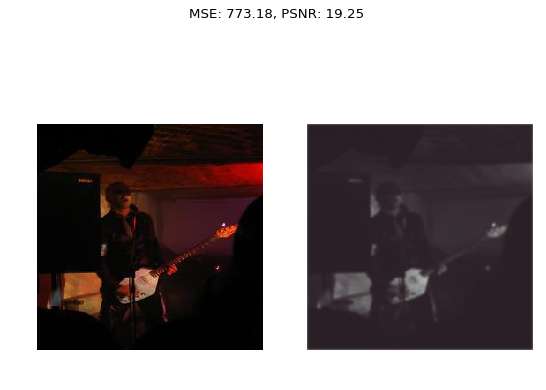

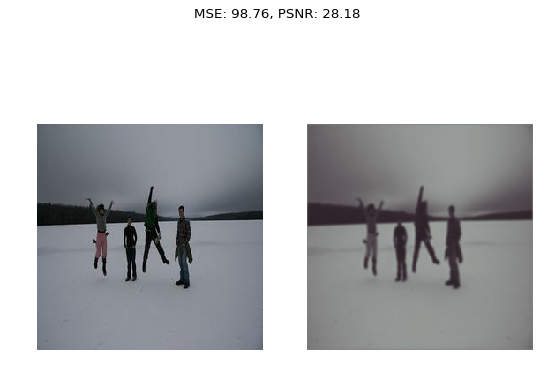

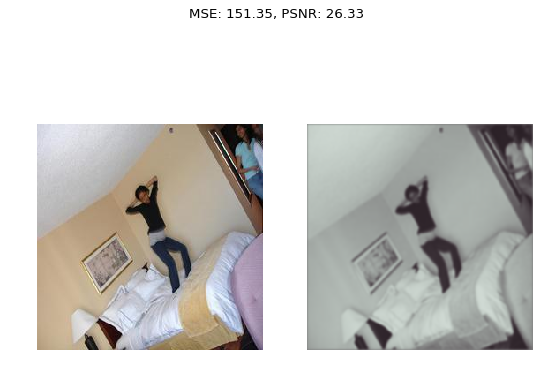

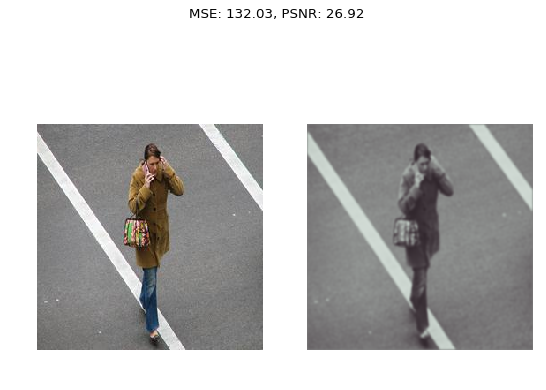

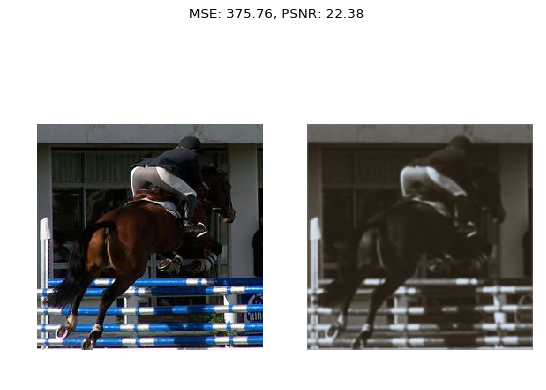

...

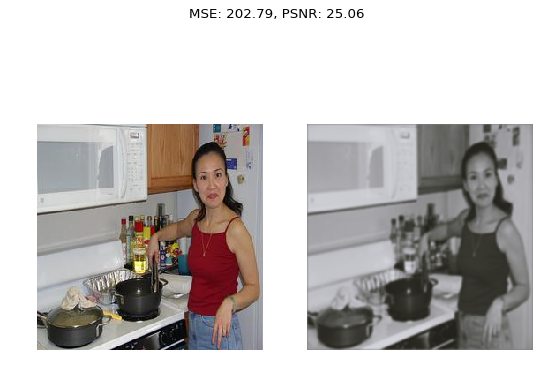

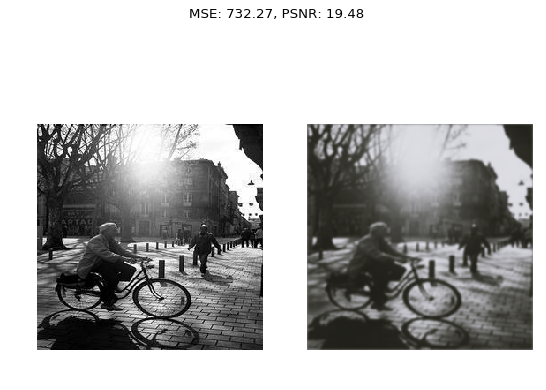

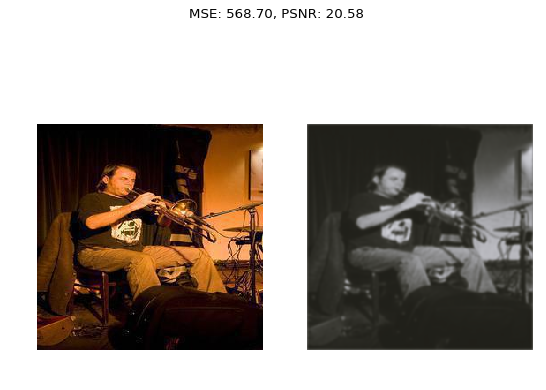

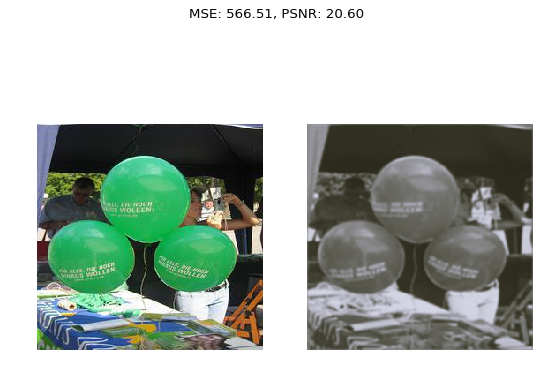

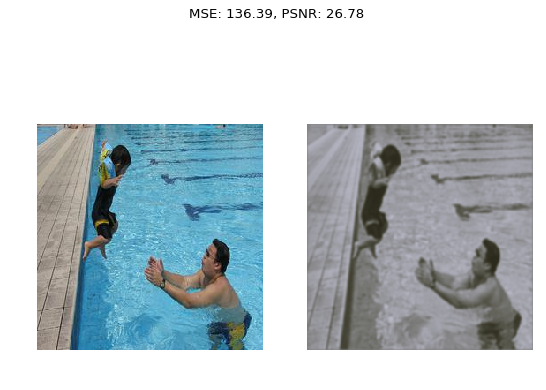

In [181]:
for i in range(len(target_images)):
    if i < len(src_images): 
        compare_images(src_images[i], target_images[i], 'Image '+ str(i))

### 2. Model without L2 Regularization

In [158]:
MODEL_VERSION = 'vgg19v2n3rs0.5' 
result_storage_dir = os.path.join('./resultStorage/', MODEL_VERSION)
source_eval_dir = '/home/chuiyiliu3/srv/VOCdevkit/VOC2012/toy_test_30'
target_erval_dir = os.path.join(result_storage_dir, 'output/test_result_imgs/restored_rgb')

src_image_list = glob.glob(os.path.join(source_eval_dir, '*.*'))
target_image_list =  glob.glob(os.path.join(target_erval_dir, '*.*'))

In [159]:
src_images = np.array([read_img(x) for x in sorted(src_image_list)])
target_images = np.array([read_img(x) for x in sorted(target_image_list)])

print("source images num: {} \ntarget images num: {}".format(len(src_images), len(target_images)))
print(src_images.shape)

source images num: 30 
target images num: 600
(30, 256, 256, 3)


In [160]:
print('Image quality for model {}'.format(MODEL_VERSION))
print('==> Average MSE: {}'.format(compute_color_mse(src_images, target_images)))
print('==> Average PSNR: {}'.format(measure_psnr(src_images, target_images)))

Image quality for model vgg19v2n3rs0.5
==> Average MSE: 306.79429662068685
==> Average PSNR: 24.806757444273586


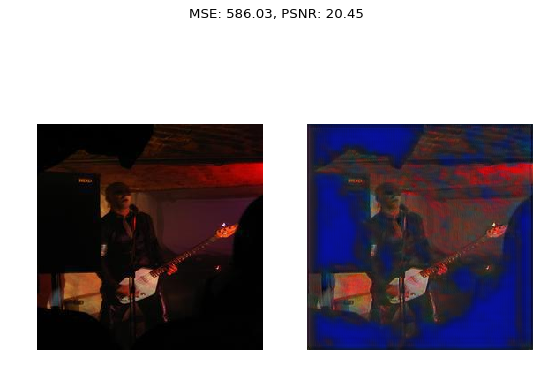

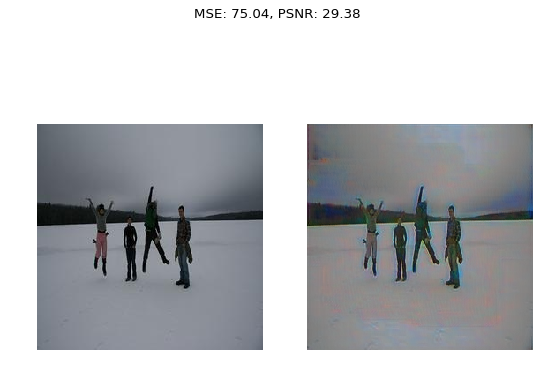

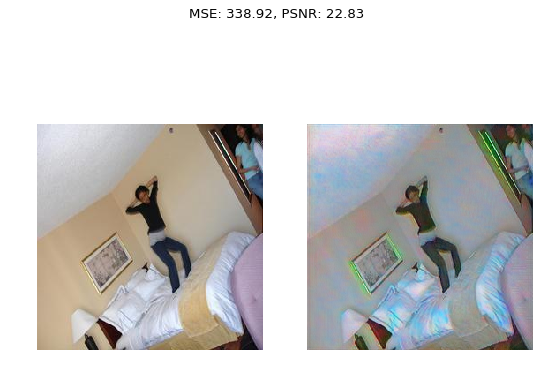

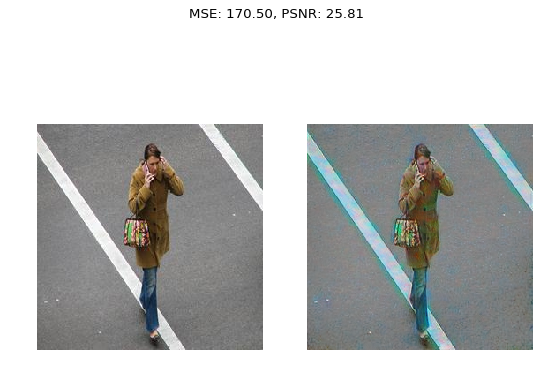

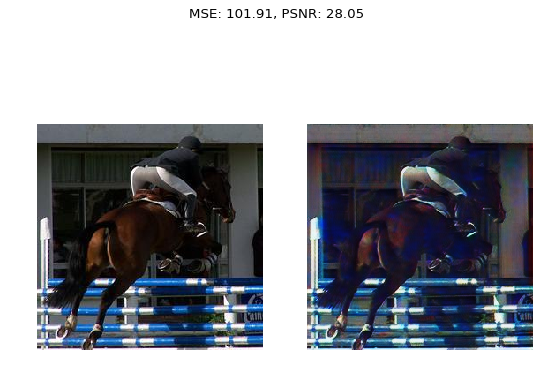

...

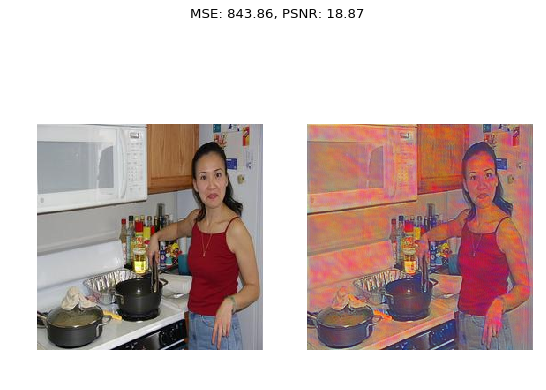

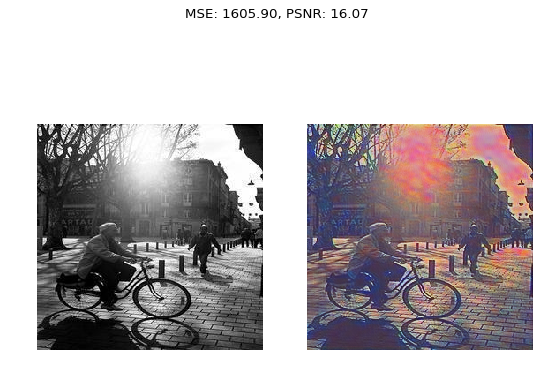

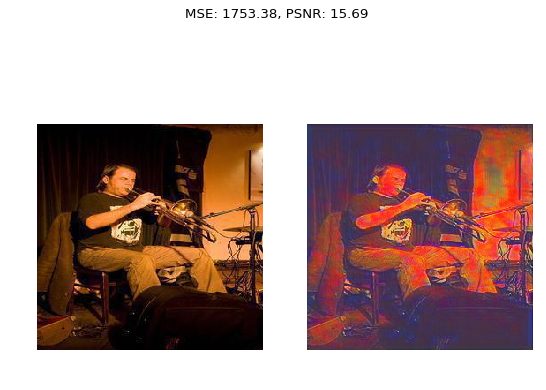

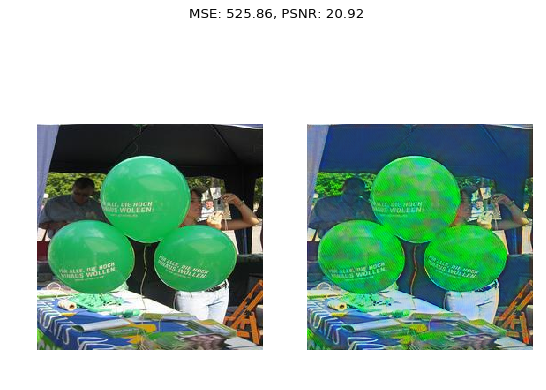

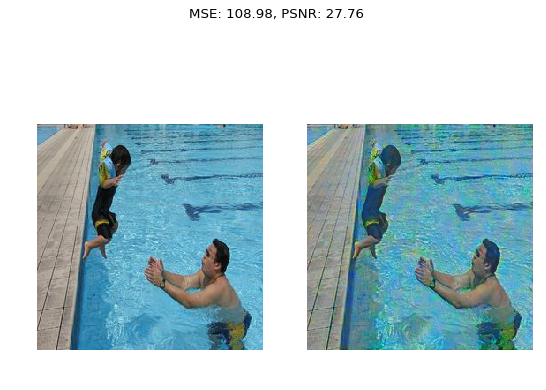

In [161]:
for i in range(len(src_images)):
    if i < len(src_images): 
        compare_images(src_images[i], target_images[i], 'Image '+ str(i))


### Summary

A table to showcase the average image quality produced by different models. 

- Models are trained on 2000 training data, validated on 2000 test data and tested on 30 test data.
- Multiplicative noise is added to these models where <strong>*σ*</strong> is the scaling factor of the noise
- Performance of the model is measured by the image quality of the restored RGB images with respect to the groundtruths. Algorithms for image quality include <strong>MSE</strong>, <strong>PSNR</strong>.
- MSE / PSNR is measured over 20 trials to get the average values


#### Average test set MSE  of VGG19, VGG19 - l2 regularized over 20 trials.

|σ| VGG19 |VGG19-l2 regularized |
|:------|:-------------|:------------- |
|0.1| MSE: 24.06<br> PSNR: 35.15| MSE: 31.51<br> PSNR: 33.74|
|0.2| MSE: 62.64<br> PSNR: 31.41| MSE: 66.72<br> PSNR: 30.89|
|0.3| MSE: 122.11<br> PSNR: 28.69| MSE: 118.91<br> PSNR: 28.57|
|0.4| MSE: 201.61<br> PSNR: 26.60| MSE: 184.53<br> PSNR: 26.73|
|0.5| MSE: 306.79<br> PSNR: 24.81| MSE: 263.89<br> PSNR: 25.19|



In [ ]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-deep')

plt.subplot(2,1,1)
plt.plot([0.1, 0.2, 0.3, 0.4, 0.5], 
        [24.06, 62.64, 122.11, 201.61, 306.79], 
         'r--',
         label='VGG19',
        )
plt.plot([0.1, 0.2, 0.3, 0.4, 0.5], 
        [31.51, 66.72, 118.91, 184.53, 263.89], 
         'b.-',
         label='VGG19- L2 regualrization')
plt.axis([0.1, 0.5, 0, 350])
plt.legend(loc='lower right')
plt.xlabel('Noise Scaling Factor')
plt.ylabel('Average MSE')
plt.title('VOC2012: Average MSE against the scaling factor of muplicative noie',
         pad=20)

plt.show()

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-deep')

plt.subplot(2,1,1)
plt.plot([0.1, 0.2, 0.3, 0.4, 0.5], 
        [35.15, 31.41, 28.69, 26.60, 24.81], 
         'r--',
         label='VGG19',
        )
plt.plot([0.1, 0.2, 0.3, 0.4, 0.5], 
        [33.74, 30.89, 28.57, 26.73, 25.19], 
         'b.-',
         label='VGG19- L2 regualrization')
plt.axis([0.1, 0.5, 0, 40])
plt.legend(loc='lower right')
plt.xlabel('Noise Scaling Factor')
plt.ylabel('Average PSNR')
plt.title('VOC2012: Average PSNR against the scaling factor of muplicative noie',
         pad=20)

plt.show()


|Model Version| Description | MSE | PSNR |
|:------|:-------------|------| ------|
|vgg19v2n3rs0.5| No Regualarization (noise S.F = 0.1)| 24.06 |
|vgg19v2n3rs0.5| No Regualarization (noise S.F = 0.2)| 62.64 |
|vgg19v2n3rs0.5| No Regualarization (noise S.F = 0.3)| 122.11|
|vgg19v2n3rs0.5| No Regualarization (noise S.F = 0.4)| 201.61 |
|vgg19v2n3rs0.5| No Regualarization (noise S.F = 0.5)| 306.79 |
|vgg19v5rs0.1| L2 Regualarization (noise S.F = 0.1)| 31.51 |
|vgg19v5rs0.2| L2 Regualarization (noise S.F = 0.2)| 66.72 |
|vgg19v5rs0.3| L2 Regualarization (noise S.F = 0.3)| 118.91 |
|vgg19v5rs0.4| L2 Regualarization (noise S.F = 0.4)| 184.53 |
|vgg19v5rs0.5| L2 Regualarization (noise S.F = 0.5)| 263.89 |